## Colab System Specifications
___

In [ ]:
import time, psutil
!nvidia-smi -L

Start = time.time()- psutil.boot_time()
Left= 12*3600 - Start
print('Time remaining for this session is: ', Left/3600)

GPU 0: Tesla T4 (UUID: GPU-0f903154-5a42-8de0-8e6d-0dcd702359eb)
Time remaining for this session is:  11.9864721214109


In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-0f903154-5a42-8de0-8e6d-0dcd702359eb)


In [ ]:
!nvidia-smi
!nvidia-smi -L

Sun Jan  3 12:41:44 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!lscpu |grep 'Model name'

Model name:          Intel(R) Xeon(R) CPU @ 2.20GHz


# 1.Install TensorFlow Object Detection Dependencies
___

In [ ]:
!pip install --upgrade pip
!pip install --upgrade protobuf

     |████████████████████████████████| 1.5MB 17.3MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 1.0 MB 13.2 MB/s 
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.12.4
    Uninstalling protobuf-3.12.4:
      Successfully uninstalled protobuf-3.12.4


In [ ]:
%tensorflow_version 1.15
import tensorflow as tf
print(tf.__version__)

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.15`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.
1.15.2


In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2390, done.
remote: Counting objects: 100% (2390/2390), done.
remote: Compressing objects: 100% (1978/1978), done.
remote: Total 2390 (delta 564), reused 1497 (delta 385), pack-reused 0
Receiving objects: 100% (2390/2390), 30.74 MiB | 39.59 MiB/s, done.
Resolving deltas: 100% (564/564), done.


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# change to working tensorflow directory on the drive
%cd '/content/gdrive/My Drive/models/research/'

Mounted at /content/gdrive
/content/gdrive/My Drive/models/research


In [ ]:
!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk
!protoc object_detection/protos/*.proto --python_out=.
!pip install -q pycocotools

!python setup.py build
!python setup.py install

Selecting previously unselected package python-bs4.
(Reading database ... 145483 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpacking pyt

In [ ]:
!pip install tensorflow-object-detection-api

     |████████████████████████████████| 577 kB 12.9 MB/s 
     |████████████████████████████████| 45 kB 4.7 MB/s 
     |████████████████████████████████| 54 kB 4.0 MB/s 
     |████████████████████████████████| 2.6 MB 67.3 MB/s 
  Created wheel for tensorflow-object-detection-api: filename=tensorflow_object_detection_api-0.1.1-py3-none-any.whl size=844513 sha256=9ee2b90c87241164d4b1aafaa31ccc83823099c447c2e30318fad47c1a0b5219
  Stored in directory: /root/.cache/pip/wheels/1a/99/e7/ea0c585728781ffd2670ed324603ee4814c8a751830134be83
  Created wheel for gast: filename=gast-0.2.2-py3-none-any.whl size=7538 sha256=520956b6b0f1a873eea922b3e385772c89fda35de82bda7578eca4c93d3b2b21
  Stored in directory: /root/.cache/pip/wheels/19/a7/b9/0740c7a3a7d1d348f04823339274b90de25fbcd217b2ee1fbe
Successfully built tensorflow-object-detection-api gast
  Attempting uninstall: gast
    Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3


In [ ]:
!pip install tf_slim
%cd /content/gdrive/My\ Drive/models/research/
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/models/research:/content/gdrive/My Drive/models/research/slim'

     |████████████████████████████████| 352 kB 23.6 MB/s 
/content/gdrive/My Drive/models/research


In [ ]:
%cd /content/gdrive/My\ Drive/models/research
!python object_detection/builders/model_builder_test.py

/content/gdrive/My Drive/models/research


# 2.Generating the .record files for the training and the testing set
___

In [ ]:
%cd /content/gdrive/My\ Drive/

/content/gdrive/My Drive


In [ ]:
!python scripts/preprocessing/generate_tfrecord.py -c models/research/object_detection/data/train_aug_labels.csv -o models/research/object_detection/data/train_aug.record -i models/research/object_detection/images/train_aug -l models/research/object_detection/data/label_map.pbtxt

Successfully created the TFRecord file: models/research/object_detection/data/train_aug.record
Successfully created the CSV file: models/research/object_detection/data/train_aug_labels.csv


In [ ]:
!python scripts/preprocessing/generate_tfrecord.py -c models/research/object_detection/data/test_labels.csv -o models/research/object_detection/data/test2.record -i models/research/object_detection/images/test2 -l models/research/object_detection/data/label_map.pbtxt

Successfully created the TFRecord file: models/research/object_detection/data/test2.record
Successfully created the CSV file: models/research/object_detection/data/test_labels.csv


In [ ]:
!python scripts/preprocessing/generate_tfrecord_xml.py -x models/research/object_detection/images/train_aug -l models/research/object_detection/data/label_map.pbtxt -o models/research/object_detection/data/train_aug2.record

Successfully created the TFRecord file: models/research/object_detection/data/train_aug2.record


In [ ]:
!python scripts/preprocessing/generate_tfrecord_xml.py -x models/research/object_detection/images/test -l models/research/object_detection/data/label_map.pbtxt -o models/research/object_detection/data/test.record

python3: can't open file 'scripts/preprocessing/generate_tfrecord_xml.py': [Errno 2] No such file or directory


In [ ]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
test_record_fname = '/content/gdrive/My Drive/models/research/object_detection/data/test.tfrecord'
train_record_fname = '/content/gdrive/My Drive/models/research/object_detection/data/train_aug.tfrecord'
label_map_pbtxt_fname = '/content/gdrive/My Drive/models/research/deploy/label_map.pbtxt'

#Setting up the model parameters
___

In [ ]:
# Number of training steps.
num_steps = 210000  # 200000

# Number of evaluation steps.
num_eval_steps = 100

MODELS_CONFIG = {
    'ssd_mobilenet_v1': {
        'model_name': 'ssd_mobilenet_v1_coco_2018_01_28',
        'pipeline_file': 'ssd_mobilenet_v1_coco.config',
        'batch_size': 24
    },
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 24
    },
    'rfcn_resnet101': {
        'model_name': 'rfcn_resnet101_coco_2018_01_28',
        'pipeline_file': 'rfcn_resnet101_pets.config',
        'batch_size': 8
    }
}

# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

In [ ]:
%cd /content/gdrive/My\ Drive/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = 'pretrained_model/'


/content/gdrive/My Drive/models/research


In [ ]:
!echo {DEST_DIR}
%ls {DEST_DIR}

pretrained_model/


In [ ]:
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'pretrained_model/model.ckpt'

In [ ]:
import os
pipeline_fname = os.path.join('/content/gdrive/My Drive/models/research/object_detection/samples/configs/', pipeline_file)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [ ]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)

# 3.Creating the configuration file
___

In [ ]:
import re

%cd /content/gdrive/My Drive/models/research/deploy3/
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)

/content/gdrive/My Drive/models/research/deploy3
writing custom configuration file


In [ ]:
!cat /content/gdrive/My\ Drive/models/research/deploy3/pipeline_file_v2.config

cat: '/content/gdrive/My Drive/models/research/deploy3/pipeline_file_v2.config': No such file or directory


In [ ]:
%cd /content/gdrive/My\ Drive/models/research/

/content/gdrive/My Drive/models/research


In [ ]:
pipeline_file = 'deploy3/pipeline_file_v2.config'
model_dir = 'object_detection/training(ssd_mobilenet_v2)/'

# 4.Training a custom TF Object Detector
___

In [ ]:
!python /content/gdrive/My\ Drive/models/research/object_detection/model_main.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --num_eval_steps={num_eval_steps}

Streaming output truncated to the last 5000 lines.
INFO:tensorflow:Saving checkpoints for 8267 into object_detection/training_aug/model.ckpt.
I1229 03:09:59.516008 140711451871104 basic_session_run_hooks.py:606] Saving checkpoints for 8267 into object_detection/training_aug/model.ckpt.
INFO:tensorflow:Skip the current checkpoint eval due to throttle secs (600 secs).
I1229 03:10:01.033673 140711451871104 training.py:527] Skip the current checkpoint eval due to throttle secs (600 secs).
INFO:tensorflow:global_step/sec: 2.39229
I1229 03:10:14.814207 140711451871104 basic_session_run_hooks.py:692] global_step/sec: 2.39229
INFO:tensorflow:loss = 4.9519105, step = 8300 (41.800 sec)
I1229 03:10:14.815050 140711451871104 basic_session_run_hooks.py:260] loss = 4.9519105, step = 8300 (41.800 sec)
INFO:tensorflow:global_step/sec: 2.48447
I1229 03:10:55.064265 140711451871104 basic_session_run_hooks.py:692] global_step/sec: 2.48447
INFO:tensorflow:loss = 4.809048, step = 8400 (40.250 sec)
I1229 03

# 5.Visualizing the results with Tensorboard
___

In [ ]:
from tensorboard import version
print(version.VERSION)

1.15.0


In [ ]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip -o ngrok-stable-linux-amd64.zip

--2020-12-23 20:30:46--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 3.230.235.205, 54.145.36.98, 3.94.231.163, ...
Connecting to bin.equinox.io (bin.equinox.io)|3.230.235.205|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13773305 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip.5’

ngrok-stable-linux- 100%[===================>]  13.13M  16.8MB/s    in 0.8s    

2020-12-23 20:30:47 (16.8 MB/s) - ‘ngrok-stable-linux-amd64.zip.5’ saved [13773305/13773305]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


In [ ]:
LOG_DIR = '/content/gdrive/My Drive/models/research/object_detection/training/'
LOG_DIR

'/content/gdrive/My Drive/models/research/object_detection/training/'

In [ ]:
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)

In [ ]:
get_ipython().system_raw('./ngrok http 6006 &')

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

http://d1063128a4b0.ngrok.io


In [ ]:
logdir = '/content/gdrive/My Drive/models/research/object_detection/training/'

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/My\ Drive/models/research/object_detection/training

# 6.Getting a Tensorflow frozen graph
___

In [ ]:
!python /content/gdrive/My\ Drive/models/research/object_detection/export_tflite_ssd_graph.py \
  --pipeline_config_path /content/gdrive/My\ Drive/models/research/deploy3/pipeline_file.config \
  --trained_checkpoint_prefix /content/gdrive/My\ Drive/models/research/object_detection/training3/model.ckpt-193043 \
  --output_directory /content/gdrive/My\ Drive/models/research/object_detection/exported_model3 \
  --add_postprocessing_op True



W1119 12:03:17.709692 139631370676096 module_wrapper.py:139] From /content/gdrive/My Drive/models/research/object_detection/export_tflite_ssd_graph.py:137: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Instructions for updating:
Please use `layer.__call__` method instead.
W1119 12:03:18.174607 139631370676096 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I1119 12:03:20.949849 139631370676096 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I1119 12:03:20.999030 139631370676096 convolutional_box_predictor.py:156] depth of additional conv before box predictor:

# 7.Converting frozen graph to .tflite file
___



In [ ]:
%cd /content/gdrive/My\ Drive/models/research/

/content/gdrive/My Drive/models/research


## 7.1 Float

In [ ]:
import tensorflow as tf

graph_def_file = "object_detection/exported_model3/tflite_graph.pb"
input_arrays = ["normalized_input_image_tensor"]
output_arrays = [
        'TFLite_Detection_PostProcess', 'TFLite_Detection_PostProcess:1',
        'TFLite_Detection_PostProcess:2', 'TFLite_Detection_PostProcess:3' ]

converter = tf.lite.TFLiteConverter.from_frozen_graph( 
    graph_def_file, 
    input_arrays, 
    output_arrays, 
    input_shapes={'normalized_input_image_tensor':[1, 300, 300, 3]} )

converter.allow_custom_ops = True
tflite_model = converter.convert()
open("object_detection/exported_model3/detect.tflite", "wb").write(tflite_model)

19551660

## 7.2 Quantized ???

In [ ]:
import tensorflow as tf
graph_def_file = "object_detection/exported_model2/tflite_graph.pb"
input_arrays = ["normalized_input_image_tensor"]
output_arrays = [
        'TFLite_Detection_PostProcess', 'TFLite_Detection_PostProcess:1',
        'TFLite_Detection_PostProcess:2', 'TFLite_Detection_PostProcess:3'
    ]
converter = tf.lite.TFLiteConverter.from_frozen_graph(
  graph_def_file, 
  input_arrays, 
  output_arrays, 
  input_shapes={"normalized_input_image_tensor":[1, 300, 300, 3]}
  )

converter.inference_type = tf.uint8
converter.quantized_input_stats = {"normalized_input_image_tensor":(127.5,127.5)}
converter.change_concat_input_ranges = False
converter.allow_custom_ops = True
tflite_model = converter.convert()
open("object_detection/exported_model2/cuisine_tfquant.tflite", "wb").write(tflite_model)

# 8.Adding metadata to the model

In [ ]:
pip install tflite-support

     |████████████████████████████████| 1.0 MB 11.2 MB/s 
     |████████████████████████████████| 188 kB 43.7 MB/s 


## New Model Info

In [ ]:
from tflite_support import flatbuffers
from tflite_support import metadata as _metadata
from tflite_support import metadata_schema_py_generated as _metadata_fb

""" ... """
"""Creates the metadata for an image classifier."""

# Creates model info.
model_meta = _metadata_fb.ModelMetadataT()
model_meta.name = "MobileNetV1 image classifier"
model_meta.description = ("Identify Unesco Monuments Route"
                          "image from a set of 18 categories")
model_meta.version = "v1"
model_meta.author = "TensorFlow"
model_meta.license = ("Apache License. Version 2.0 "
                      "http://www.apache.org/licenses/LICENSE-2.0.")

## Input/Output Information

In [ ]:
# Creates input info.
input_meta = _metadata_fb.TensorMetadataT()

# Creates output info.
output_meta = _metadata_fb.TensorMetadataT()

## Image Input

In [ ]:
input_meta.name = "image"
input_meta.description = (
    "Input image to be classified. The expected image is {0} x {1}, with "
    "three channels (red, blue, and green) per pixel. Each value in the "
    "tensor is a single byte between 0 and 255.".format(300, 300))
input_meta.content = _metadata_fb.ContentT()
input_meta.content.contentProperties = _metadata_fb.ImagePropertiesT()
input_meta.content.contentProperties.colorSpace = (
    _metadata_fb.ColorSpaceType.RGB)
input_meta.content.contentPropertiesType = (
    _metadata_fb.ContentProperties.ImageProperties)
input_normalization = _metadata_fb.ProcessUnitT()
input_normalization.optionsType = (
    _metadata_fb.ProcessUnitOptions.NormalizationOptions)
input_normalization.options = _metadata_fb.NormalizationOptionsT()
input_normalization.options.mean = [127.5]
input_normalization.options.std = [127.5]
input_meta.processUnits = [input_normalization]
input_stats = _metadata_fb.StatsT()
input_stats.max = [255]
input_stats.min = [0]
input_meta.stats = input_stats

## Label Output

In [ ]:
# Creates output info.
output_meta = _metadata_fb.TensorMetadataT()
output_meta.name = "probability"
output_meta.description = "Probabilities of the 18 labels respectively."
output_meta.content = _metadata_fb.ContentT()
output_meta.content.content_properties = _metadata_fb.FeaturePropertiesT()
output_meta.content.contentPropertiesType = (
    _metadata_fb.ContentProperties.FeatureProperties)
output_stats = _metadata_fb.StatsT()
output_stats.max = [1.0]
output_stats.min = [0.0]
output_meta.stats = output_stats
label_file = _metadata_fb.AssociatedFileT()
label_file.name = os.path.basename('/content/gdrive/My Drive/models/research/deploy/labelmap.txt')
label_file.description = "Labels for objects that the model can recognize."
label_file.type = _metadata_fb.AssociatedFileType.TENSOR_AXIS_LABELS
output_meta.associatedFiles = [label_file]

## Creating the metadata Flatbuffers

In [ ]:
# Creates subgraph info.
subgraph = _metadata_fb.SubGraphMetadataT()
subgraph.inputTensorMetadata = [input_meta]
subgraph.outputTensorMetadata = 4*[output_meta]
model_meta.subgraphMetadata = [subgraph]

b = flatbuffers.Builder(0)
b.Finish(
    model_meta.Pack(b),
    _metadata.MetadataPopulator.METADATA_FILE_IDENTIFIER)
metadata_buf = b.Output()

In [ ]:
metadata_buf 

bytearray(b'\x18\x00\x00\x00M001\x10\x00\x1c\x00\x18\x00\x14\x00\x10\x00\x0c\x00\x08\x00\x04\x00\x10\x00\x00\x00\x18\x00\x00\x00`\x00\x00\x00l\x00\x00\x00\xbc\x05\x00\x00\xc0\x05\x00\x00\x04\x06\x00\x00G\x00\x00\x00Apache License. Version 2.0 http://www.apache.org/licenses/LICENSE-2.0.\x00\n\x00\x00\x00TensorFlow\x00\x00\x01\x00\x00\x00\x10\x00\x00\x00\x0c\x00\x0c\x00\x00\x00\x00\x00\x08\x00\x04\x00\x0c\x00\x00\x00\x08\x00\x00\x00\xc8\x03\x00\x00\x04\x00\x00\x00\xd0\x02\x00\x00\xd4\x01\x00\x00\xec\x00\x00\x00\x04\x00\x00\x00R\xfd\xff\xff\x14\x00\x00\x00t\x00\x00\x00\x8c\x00\x00\x00\x90\x00\x00\x00\xc0\x00\x00\x00\x01\x00\x00\x00\x04\x00\x00\x00>\xfd\xff\xff\x00\x00\x00\x02\x08\x00\x00\x00<\x00\x00\x000\x00\x00\x00Labels for objects that the model can recognize.\x00\x00\x00\x00\x0c\x00\x00\x00labelmap.txt\x00\x00\x00\x00d\xfc\xff\xff\x08\x00\x00\x00\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x80?J\xfc\xff\xff\x00\x00\x00\x01,\x00\x00\x00Probabilities of the 

## Writting Metadata and the Label file into the TFLite file

In [ ]:
populator = _metadata.MetadataPopulator.with_model_file('/content/gdrive/My Drive/models/research/object_detection/exported_model3/detect.tflite')
populator.load_metadata_buffer(metadata_buf)
populator.load_associated_files(['/content/gdrive/My Drive/models/research/deploy/labelmap.txt'])
populator.populate()

## Visualizing the results with a Json file

In [ ]:
displayer = _metadata.MetadataDisplayer.with_model_file('/content/gdrive/My Drive/models/research/object_detection/exported_model3/detect.tflite')
export_json_file = os.path.join('/content/gdrive/My Drive/models/research/object_detection/exported_model3',
                    os.path.splitext('detect.tflite')[0] + ".json")
json_file = displayer.get_metadata_json()
# Optional: write out the metadata as a json file
with open(export_json_file, "w") as f:
  f.write(json_file)

In [ ]:
displayer = _metadata.MetadataDisplayer.with_model_file(
        '/content/gdrive/My Drive/models/research/object_detection/exported_model3/detect.tflite')
export_json_file = os.path.join(
        '/content/gdrive/My Drive/models/research/object_detection/exported_model3',
        os.path.splitext('detect.tflite')[0] + ".json")
json_file = displayer.get_metadata_json()

with open(export_json_file, "w") as f:
  f.write(json_file)

# Check tensorflow input-output

In [ ]:
import tensorflow as tf

interpreter = tf.lite.Interpreter(model_path="/content/gdrive/My Drive/models/research/object_detection/exported_model/detect.tflite")
interpreter.allocate_tensors()

# Print input shape and type
inputs = interpreter.get_input_details()
print('{} input(s):'.format(len(inputs)))
for i in range(0, len(inputs)):
    print('{} {}'.format(inputs[i]['shape'], inputs[i]['dtype']))

# Print output shape and type
outputs = interpreter.get_output_details()
print('\n{} output(s):'.format(len(outputs)))
for i in range(0, len(outputs)):
    print('{} {}'.format(outputs[i]['shape'], outputs[i]['dtype']))

1 input(s):
[  1 300 300   3] <class 'numpy.float32'>

4 output(s):
[ 1 10  4] <class 'numpy.float32'>
[ 1 10] <class 'numpy.float32'>
[ 1 10] <class 'numpy.float32'>
[1] <class 'numpy.float32'>


# Run inference test

In [ ]:
!python /content/models/research/object_detection/export_inference_graph.py \
  --input_type=image_tensor \
  --pipeline_config_path /content/gdrive/My\ Drive/models/research/deploy3/pipeline_file.config \
  --output_directory /content/gdrive/My\ Drive/models/research/object_detection/exported_model4 \
  --trained_checkpoint_prefix /content/gdrive/My\ Drive/models/research/object_detection/training4/model.ckpt-165487

In [ ]:
pb_fname = "/content/gdrive/My Drive/models/research/object_detection/exported_model(ssd_mobilenet_v2) for test/frozen_inference_graph.pb"
label_map_pbtxt_fname = '/content/gdrive/My Drive/models/research/deploy/label_map.pbtxt'
test_images_path = '/content/gdrive/My Drive/models/research/object_detection/test_images/'
test_images_path

'/content/gdrive/My Drive/models/research/object_detection/test_images/'

In [ ]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR = test_images_path
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*Trigonion*.jpg*"))
TEST_IMAGE_PATHS += glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*Trigonion*.JPG*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_8.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_187.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_168.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_9.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_44.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_12.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_143.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_81.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_91.jpg', '/content/gdrive/My Drive/models/research/object_detection/test_images/Trigonion_Tower_31.jpg', '/content/gdrive/My Drive/models/resea

In [ ]:
%cd /content/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops


# This is needed to display the images.
%matplotlib inline


from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util

/content/models/research/object_detection


In [ ]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict

In [ ]:
# Output images not showing? Run this cell again, and try the cell above
# This is needed to display the images.
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


47


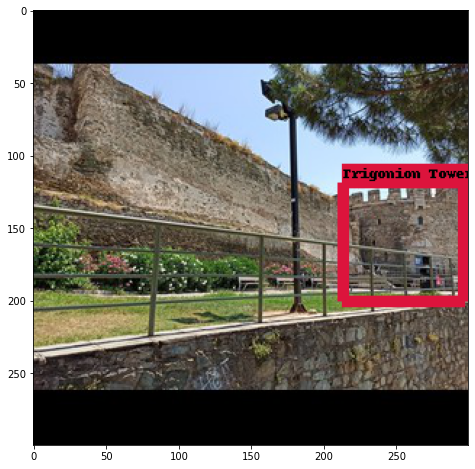

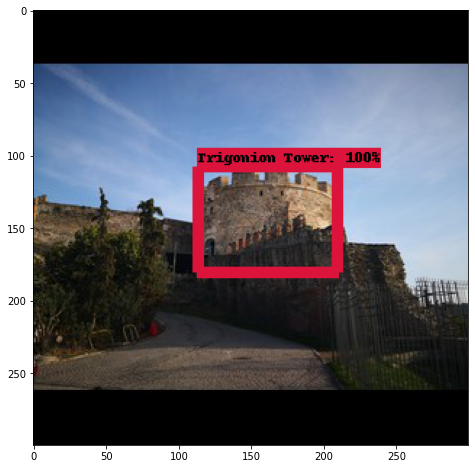

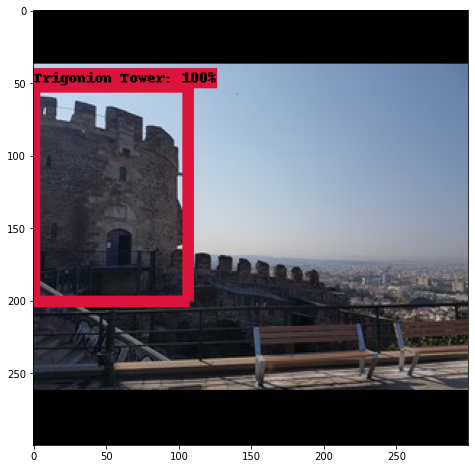

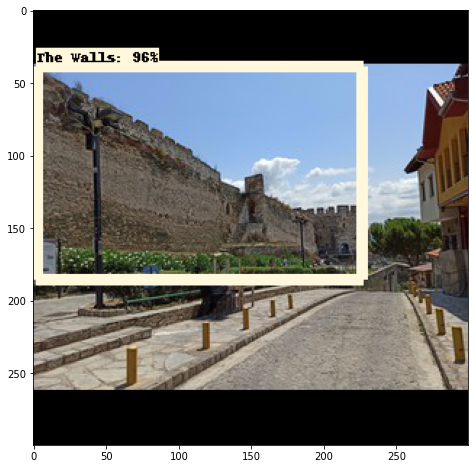

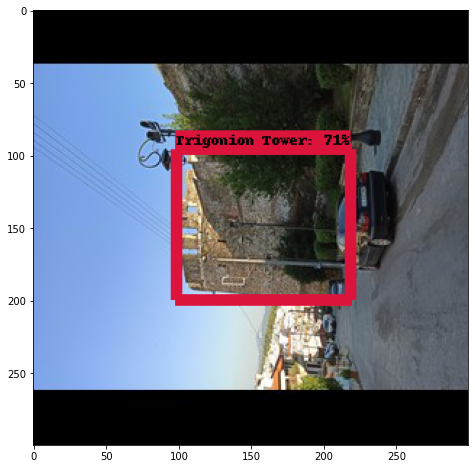

...

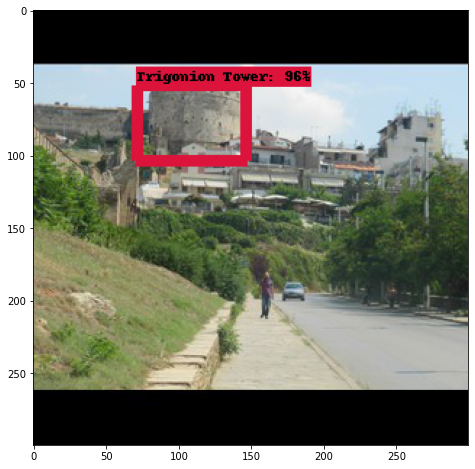

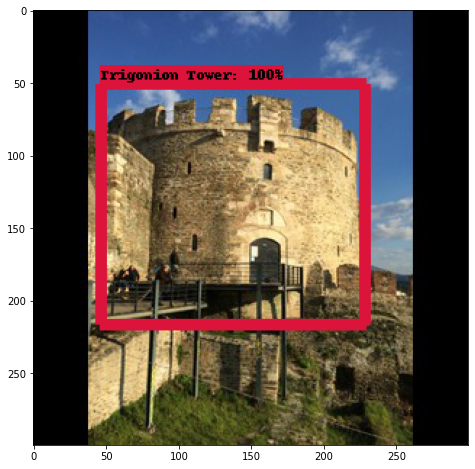

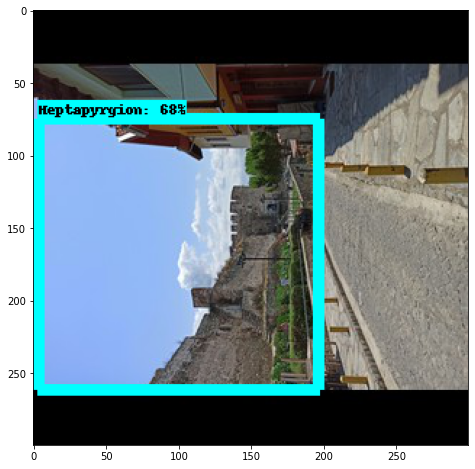

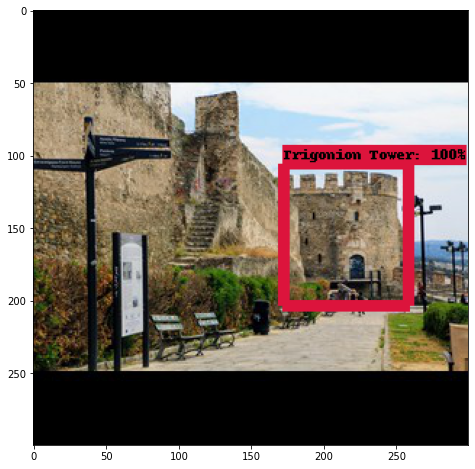

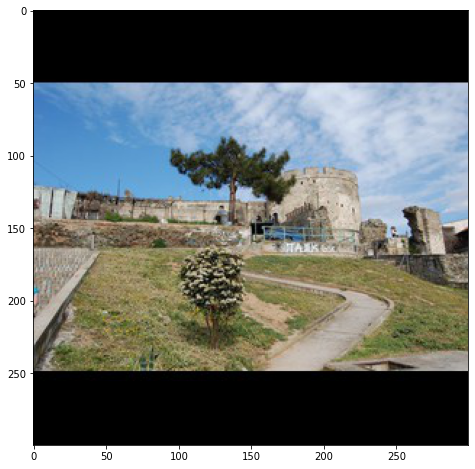

In [ ]:
sum = 0
for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    sum += 1
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=8)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)
print(sum)